In [1]:
import geopandas as gpd
import pandas as pd
import networkx as nx
import osmnx as ox
import contextily as cx
import numpy as np
import joblib
import math
from pyrosm import OSM, get_data
import matplotlib.pyplot as plt
# fold
import functools

from osmium.geom import haversine_distance
import osmium

In [2]:
data_folder = "./openstreetmap data/"
osm_fp = "./openstreetmap data/porto.osm.pbf"
osm = OSM(osm_fp)

In [3]:
# load the graph
porto_nodes = gpd.read_file(data_folder + "porto_nodes.gpkg")
porto_edges = gpd.read_file(data_folder + "porto_edges-fix.gpkg")

porto_nodes.crs = "EPSG:4326"
porto_edges.crs = "EPSG:4326"


# G = osm.to_graph(porto_nodes, porto_edges2, graph_type='networkx', node_id_col='osmid', network_type='all')
G = osm.to_graph(porto_nodes, porto_edges, graph_type='networkx', node_id_col='osmid', network_type='all')

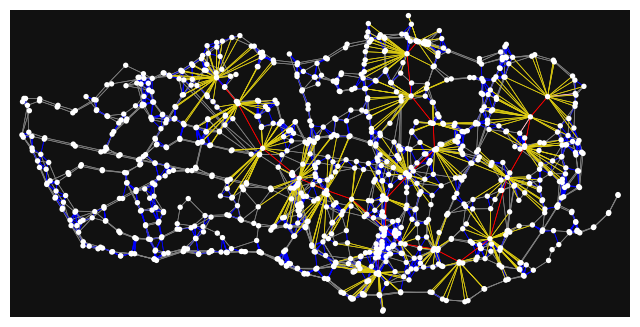

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [34]:
ox.plot_graph(G, edge_color=['#ddcc11' if d.get('tag') == 'bus_nearest_metro' else 'pink' if d.get('tag') == 'metro_nearest_bus' else 'blue' if d.get('mode')=='walking' else 'red' if d.get('mode')=='metro' else 'gray' for u,v,d in G.edges(data=True)], edge_linewidth=0.5)

## Sections

In [4]:
sections = gpd.read_file(data_folder + "sections.gpkg")
# sections.crs = "EPSG:4326"
sections.rename(columns={'DTMNFRSEC21': 'id'}, inplace=True)

In [6]:
sections = sections.to_crs("EPSG:4326")
sections['centroid'] = sections['geometry'].centroid

,DT21,DTMN21,DTMNFR21,id,SECNUM21,N_SS,NUTS1_15,NUTS2_15,NUTS3_15,N_EDIFICIOS_CLASSICOS,...,N_INDIVIDUOS_DOMESTICOS_M,N_INDIVIDUOS_REFORMADOS_M,N_INDIVIDUOS_EMPREG_SECT_PRIM_M,N_INDIVIDUOS_EMPREG_SECT_SEC_M,N_INDIVIDUOS_EMPREG_SECT_TERC_M,N_INDIVIDUOS_NAC_ESTRANGEIRA_M,N_INDIVIDUOS_RESID_FORA_PAIS_M,Shape_Length,Shape_Area,geometry
0,13,1312,131217,131217050,050,5,1,11,11A,173.0,...,18.0,165.0,0.0,18.0,231.0,43.0,142.0,1157.177049,82504.503024,"MULTIPOLYGON (((-40251.220 165968.917, -40385...."
1,13,1312,131217,131217049,049,10,1,11,11A,192.0,...,20.0,138.0,0.0,15.0,158.0,44.0,131.0,1416.668485,89771.452029,"MULTIPOLYGON (((-40628.367 166322.358, -40627...."
2,13,1312,131203,131203025,025,9,1,11,11A,316.0,...,25.0,146.0,0.0,15.0,139.0,3.0,47.0,4653.023374,500204.920751,"MULTIPOLYGON (((-36034.760 164495.326, -36034...."
3,13,1312,131203,131203017,017,12,1,11,11A,306.0,...,27.0,146.0,0.0,14.0,144.0,15.0,51.0,3929.423593,417943.606612,"MULTIPOLYGON (((-37556.365 165662.597, -37506...."
4,13,1312,131217,131217028,028,3,1,11,11A,162.0,...,36.0,207.0,0.0,21.0,283.0,76.0,172.0,1360.397149,91336.858127,"MULTIPOLYGON (((-41192.849 166127.603, -41230...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,13,1312,131202,131202001,001,7,1,11,11A,183.0,...,21.0,124.0,0.0,3.0,106.0,3.0,29.0,2165.970737,179751.741878,"MULTIPOLYGON (((-39357.006 163890.392, -39355...."
239,13,1312,131217,131217017,017,9,1,11,11A,162.0,...,9.0,90.0,0.0,11.0,132.0,82.0,122.0,1996.898632,158854.863091,"MULTIPOLYGON (((-39939.151 164698.384, -39982...."
240,13,1312,131211,131211033,033,11,1,11,11A,89.0,...,31.0,218.0,0.0,16.0,193.0,20.0,76.0,5557.610602,884478.275118,"MULTIPOLYGON (((-43377.779 168051.879, -43341...."
241,13,1312,131202,131202014,014,3,1,11,11A,239.0,...,12.0,96.0,0.0,16.0,153.0,35.0,62.0,1427.031645,94667.991377,"MULTIPOLYGON (((-39190.169 165144.741, -39146...."


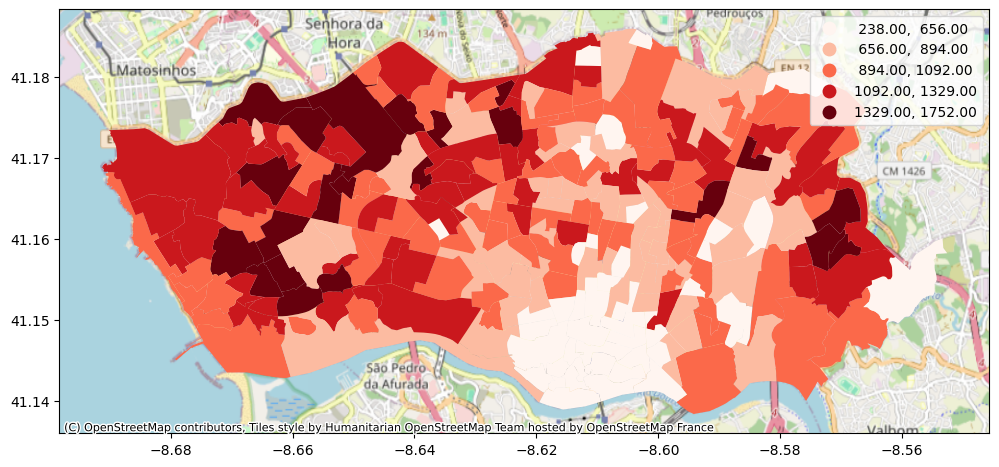

In [9]:
ax = sections.plot("N_INDIVIDUOS", scheme="natural_breaks", cmap="Reds", figsize=(12,12), legend=True, markersize=3.5)
cx.add_basemap(ax, crs=sections.crs)

In [6]:
amenities = "bar, cafe, fast_food, food_court, restaurant, college, dancing_school, driving_school, kindergarten, library, research_institute, music_school, school, university, fuel, bank, clinic, dentist, hospital, nursing_home, pharmacy, veterinary, arts_centre, cinema, community_centre, conference_centre, events_venue, exhibition_centre, music_venue, nightclub, theatre, police, post_office, townhall, animal_shelter, marketplace"

amenities = amenities.split(", ")

sections_union = sections.unary_union
# sections_union.to_crs("EPSG:4326")
sections_gdf = gpd.GeoDataFrame(geometry=[sections_union], crs="EPSG:4326")


## Amenities = tipos de espaços

In [7]:
# get the amenities
amenities_gdf = ox.features_from_polygon(sections.unary_union, tags={'amenity': amenities})


In [8]:
# change geometry to centroids
amenities_gdf['geometry'] = amenities_gdf.centroid

C:\Users\jcarv\AppData\Local\Temp\ipykernel_2112\3570013167.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  amenities_gdf['geometry'] = amenities_gdf.centroid


In [9]:
# correspond each amenity to the section it is inside of
sections_amenities = gpd.sjoin(sections, amenities_gdf, predicate='contains')

In [11]:
# have a dictionary with the amenities and the sections they are in
amenities_dict = {}
for i, row in sections_amenities.iterrows():
    if row.id not in amenities_dict:
        amenities_dict[row.id] = []
    amenities_dict[row.id].append(row.amenity)
    
amenities_count = {}
for k, v in amenities_dict.items():
    amenities_count[k] = len(v)
    
#add the amenities count to the sections
sections["N_AMENITIES"] = sections.id.map(amenities_count)
sections["N_AMENITIES_LOG"] = sections.id.map(amenities_count).apply(lambda x: math.log(x+1))

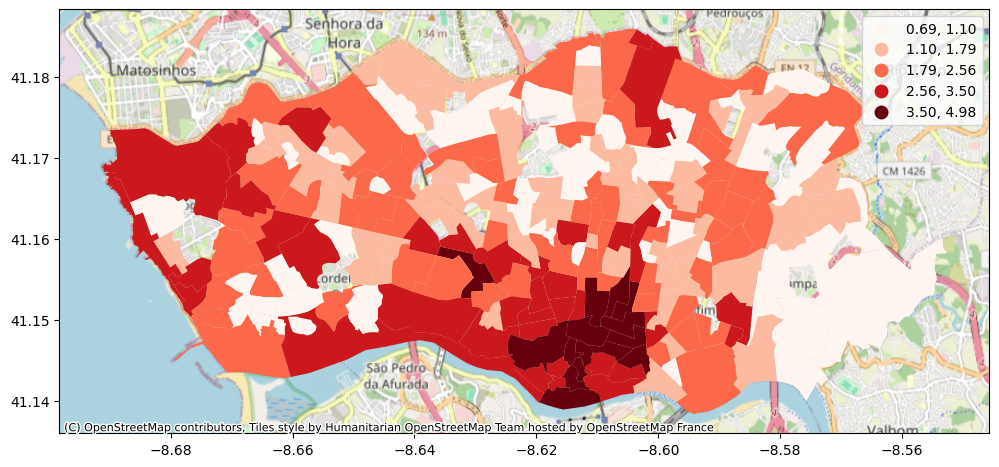

In [14]:
# plot a heatmap, log scale
ax = sections.plot("N_AMENITIES_LOG", scheme="natural_breaks", cmap="Reds", figsize=(12,12), legend=True, markersize=3.5)
cx.add_basemap(ax, crs=sections.crs)

In [12]:
demographic_stats = [  # as que podem servir para algo
 'N_ALOJAMENTOS_TOTAL',
 'N_INDIVIDUOS',
 'N_INDIVIDUOS_H',
 'N_INDIVIDUOS_M',
 'N_INDIVIDUOS_0A14',
 'N_INDIVIDUOS_15A24',
 'N_INDIVIDUOS_25A64',
 'N_INDIVIDUOS_65_OU_MAIS',
 'N_INDIVIDUOS_0A14_H',
 'N_INDIVIDUOS_15A24_H',
 'N_INDIVIDUOS_25A64_H',
 'N_INDIVIDUOS_65_OU_MAIS_H',
 'N_INDIVIDUOS_0A14_M',
 'N_INDIVIDUOS_15A24_M',
 'N_INDIVIDUOS_25A64_M',
 'N_INDIVIDUOS_65_OU_MAIS_M',
 'N_INDIVIDUO_ENSINCOMP_NENHUM',
 'N_INDIVIDUO_ENSINCOMP_1BAS',
 'N_INDIVIDUO_ENSINCOMP_2BAS',
 'N_INDIVIDUO_ENSINCOMP_3BAS',
 'N_INDIVIDUO_ENSINCOMP_SEC_E_POSSEC',
 'N_INDIVIDUO_ENSINCOMP_SUP',
 'N_INDIVIDUOS_COM_ATIVIDADE_ECONOMICA',
 'N_INDIVIDUOS_SEM_ATIVIDADE_ECONOMICA',
 'N_INDIVIDUOS_EMPREGADOS',
 'N_INDIVIDUOS_ESTUDANTES',
 'N_INDIVIDUOS_DOMESTICOS',
 'N_INDIVIDUOS_REFORMADOS',
 'N_INDIVIDUOS_EMPREG_SECT_PRIM',
 'N_INDIVIDUOS_EMPREG_SECT_SEC',
 'N_INDIVIDUOS_EMPREG_SECT_TERC',
]

In [35]:
import numpy as np
import pandas as pd
import geopandas as gpd
from scipy.spatial.distance import cdist

class SpatialInteractionModel:
    def __init__(self, sections_gdf, amenities_gdf, sections_amenities):
        """
        Initialize the spatial interaction model
        
        Parameters:
        sections_gdf: GeoDataFrame with section demographics and geometries
        amenities_gdf: GeoDataFrame with amenity points and types
        sections_amenities: dict mapping section_id to list of amenity types
        """
        self.sections_gdf = sections_gdf.copy().to_crs("EPSG:3763")
        self.amenities_gdf = amenities_gdf.copy().to_crs("EPSG:3763")
        self.sections_amenities = sections_amenities.copy()
        
        # Calculate centroids for distance matrix
        self.centroids = self.sections_gdf.geometry.centroid
        self.distances = self._calculate_distance_matrix()
        
        # Create amenity counts per section
        self.amenity_counts = self._calculate_amenity_counts()
    
    def _calculate_distance_matrix(self):
        """Calculate distance matrix between all section centroids"""
        coords = np.column_stack([
            self.centroids.x.values,
            self.centroids.y.values
        ])
        return cdist(coords, coords)
    
    def _calculate_amenity_counts(self):
        """Calculate counts of each amenity type per section"""
        amenity_counts = pd.DataFrame(
            index=self.sections_gdf['id'],
            columns=self.amenities_gdf['amenity'].unique(),
            data=0
        )
        
        
        for section_id, amenities in self.sections_amenities.items():
            if section_id in amenity_counts.index:
                for amenity_type in amenities:
                    if amenity_type in amenity_counts.columns:
                        amenity_counts.loc[section_id, amenity_type] += 1
        
        return amenity_counts
    
    def gravity_model(self, origin_pop, destination_attr, alpha=1, beta=0.2, normalize=True):
        """
        Calculate trip probabilities using a gravity model
        
        Parameters:
        origin_pop: Array of origin population values
        destination_attr: Array of destination attractiveness values
        alpha: Population exponent parameter
        beta: Distance decay parameter
        """
        # Avoid division by zero
        distances = np.maximum(self.distances, 0.1)
        # distances is in meters, sometimes hundreds or thousands, convert to km
        distances = distances / 1000
        
        # Calculate flows
        flows = (origin_pop.reshape(-1, 1) ** alpha) * \
                (destination_attr.reshape(1, -1)) / \
                (distances ** beta)
                # TODO divide by time
        if not normalize:
            return flows
        # Normalize to get probabilities
        row_sums = flows.sum(axis=1, keepdims=True)
        row_sums = np.where(row_sums == 0, 1, row_sums)  # Avoid division by zero
        return flows / row_sums
    
    
    def education_trips(self, normalize=True):
        """Model education-related trips"""
        # Different education segments
        students_0_14 = self.sections_gdf['N_INDIVIDUOS_0A14'].values
        students_15_24 = self.sections_gdf['N_INDIVIDUOS_15A24'].values
        
        # Calculate education attractiveness
        education_attractiveness = (
            self.amenity_counts['school'].values * 1.0 +
            self.amenity_counts['college'].values * 1.5 +
            self.amenity_counts['university'].values * 2.0 +
            self.amenity_counts['library'].values * 0.5
        )
        
        # Calculate trips for different age groups
        young_trips = self.gravity_model(
            students_0_14,
            education_attractiveness,
            beta=0.5,  # Higher decay for younger students
            normalize=normalize
        )
        
        older_trips = self.gravity_model(
            students_15_24,
            education_attractiveness,
            beta=0.5,  # Lower decay for older students
            normalize=normalize
        )
        
        return {
            'young_education': young_trips,
            'older_education': older_trips
        }
    
    def work_trips(self, normalize=True):
        """Model work-related trips"""
        workers = self.sections_gdf['N_INDIVIDUOS_EMPREGADOS'].values
        
        # Use employment by sector as attractiveness
        job_attractiveness = (
            self.sections_gdf['N_INDIVIDUOS_EMPREG_SECT_PRIM'].values * 0.8 +
            self.sections_gdf['N_INDIVIDUOS_EMPREG_SECT_SEC'].values * 1.0 +
            self.sections_gdf['N_INDIVIDUOS_EMPREG_SECT_TERC'].values * 1.2
        )
        
        return self.gravity_model(
            workers,
            job_attractiveness,
            beta=0.5,
            normalize=normalize
        )
    
    def entertainment_trips(self, normalize=True):
        """Model entertainment-related trips"""
        young_adults = self.sections_gdf['N_INDIVIDUOS_15A24'].values
        adults = self.sections_gdf['N_INDIVIDUOS_25A64'].values
        
        # Calculate entertainment attractiveness
        day_entertainment = (
            self.amenity_counts['cafe'].values * 1.0 +
            self.amenity_counts['restaurant'].values * 1.2 +
            self.amenity_counts['cinema'].values * 1.5 +
            self.amenity_counts['arts_centre'].values * 0.8 +
            self.amenity_counts['theatre'].values * 1.0
        )
        
        night_entertainment = (
            self.amenity_counts['bar'].values * 1.2 +
            self.amenity_counts['nightclub'].values * 1.5
            # self.amenity_counts['music_venue'].values * 1.3
        )
        
        return {
            'day_trips': self.gravity_model(
                adults * 0.6 + young_adults * 0.4,
                day_entertainment,
                beta=0.5,
                normalize=normalize
            ),
            'night_trips': self.gravity_model(
                adults * 0.3 + young_adults * 0.7,
                night_entertainment,
                beta=0.5,
                normalize=normalize
            )
        }
    
    def healthcare_trips(self, normalize=True):
        """Model healthcare-related trips"""
        elderly = self.sections_gdf['N_INDIVIDUOS_65_OU_MAIS'].values
        adults = self.sections_gdf['N_INDIVIDUOS_25A64'].values
        young = self.sections_gdf['N_INDIVIDUOS_0A14'].values
        
        basic_healthcare = (
            self.amenity_counts['clinic'].values * 1.0 +
            self.amenity_counts['pharmacy'].values * 0.8 +
            self.amenity_counts['dentist'].values * 0.9
        )
        
        specialized_healthcare = (
            self.amenity_counts['hospital'].values * 2.0 +
            self.amenity_counts['nursing_home'].values * 0.7
        )
        
        return {
            'basic_healthcare': self.gravity_model(
                elderly * 1.5 + adults + young * 1.2,
                basic_healthcare,
                beta=0.5,
                normalize=normalize
            ),
            'specialized_healthcare': self.gravity_model(
                elderly * 2.0 + adults + young,
                specialized_healthcare,
                beta=0.5,
                normalize=normalize
            )
        }
    
    def shopping_trips(self, normalize=True):
        """
        Model shopping-related trips
        """
        # Shopping population (adults and elderly)
        shoppers = (
            self.sections_gdf['N_INDIVIDUOS_25A64'].values +
            self.sections_gdf['N_INDIVIDUOS_65_OU_MAIS'].values * 0.8
        )
        
        # Shopping attractiveness
        shopping_attractiveness = (
            self.amenity_counts['marketplace'].values * 1.5 +
            self.amenity_counts['food_court'].values * 1.2
        )
        
        return {
            'daily_shopping': self.gravity_model(
                shoppers,
                shopping_attractiveness,
                beta=0.5,  # Daily shopping tends to be local,
                normalize=normalize
            ),
            'leisure_shopping': self.gravity_model(
                shoppers,
                shopping_attractiveness,
                beta=0.5,  # People might travel further for leisure shopping,
                normalize=normalize
            )
        }
    
    def administrative_trips(self, normalize=True):
        """
        Model trips to administrative services
        """
        # Adult population
        adults = (
            self.sections_gdf['N_INDIVIDUOS_25A64'].values +
            self.sections_gdf['N_INDIVIDUOS_65_OU_MAIS'].values
        )
        
        # Administrative services attractiveness
        admin_attractiveness = (
            self.amenity_counts['post_office'].values * 1.0 +
            self.amenity_counts['bank'].values * 1.2 +
            self.amenity_counts['townhall'].values * 1.5
        )
        
        return self.gravity_model(
            adults,
            admin_attractiveness,
            beta=0.5,  # Administrative trips are usually to nearby services
            normalize=normalize
        )
    
    def overall_trips(self):
        """
        Model overall trip "demands" between each section
        """
        
        # calculate unnormalized trips for each category, then sum them with different weights
        education_trips = self.education_trips(normalize=False)
        work_trips = self.work_trips(normalize=False)
        entertainment_trips = self.entertainment_trips(normalize=False)
        healthcare_trips = self.healthcare_trips(normalize=False)
        shopping_trips = self.shopping_trips(normalize=False)
        administrative_trips = self.administrative_trips(normalize=False)
        
        weights = {
            'education': 2.0,
            'work': 1.5, # usage of car?
            'entertainment': 1.0,
            'healthcare': 1.5,
            'shopping': 1.0,
            'administrative': 0.8
        }
            
        overall_trips = (
            education_trips['young_education'] * weights['education'] + \
            education_trips['older_education'] * weights['education'] + \
            work_trips * weights['work'] + \
            entertainment_trips['day_trips'] * weights['entertainment'] + \
            entertainment_trips['night_trips'] * weights['entertainment'] + \
            healthcare_trips['basic_healthcare'] * weights['healthcare'] + \
            healthcare_trips['specialized_healthcare'] * weights['healthcare'] + \
            shopping_trips['leisure_shopping'] * weights['shopping'] + \
            shopping_trips['daily_shopping'] * weights['shopping'] + \
            administrative_trips * weights['administrative']         
        )
        
        return overall_trips
        



Este modelo conta para cada secção quantas amenities há de cada tipo e calcula o número de amenities relevantes para cada "necessidade de viagem" (educação, saúde, etc.) e calcula a probabilidade de viagem entre cada secção e as outras secções. Ex: as amenities relevantes para saúde são "hospital" e "clinic", cria-se uma matriz em que M_ij é a população de um determinado grupo (indívduos 5 a 24 anos, por exemplo) de i multiplicada pelo número de amenities de j dividido pela distância entre i e j elevada a um expoente beta. A matriz é normalizada para obter probabilidades de viagem.

In [36]:
model = SpatialInteractionModel(sections, amenities_gdf, amenities_dict)
overall_trips = model.overall_trips()
# put the diagonal with 0
np.fill_diagonal(overall_trips, 0.0)

In [37]:
# plot origin destination curves on the map
# create a matrix where for each  row as a section id, origin coordinates ( a section), destination coordinates (another section) and a value for of the overall_trip flow calculated previously
# add 10 rows for each section, the top 10 values

top_10_destinations_by_origin = pd.DataFrame(columns=['section_id', 'origin_x', 'origin_y', 'dest_x', 'dest_y', 'trip_flow'])

# Iterate over each origin section
for origin_id in range(overall_trips.shape[0]):
    section_id = sections['id'].values[origin_id]
    origin_coords = sections.loc[sections['id'] == section_id].geometry.centroid
    
    # Get the top 10 destinations for the current origin
    top_destinations = np.argsort(overall_trips[origin_id])[-5:][::-1]
    
    # Add rows for each top destination
    for dest_id in top_destinations:
        dest_section_id = sections['id'].values[dest_id]
        dest_coords = sections.loc[sections['id'] == dest_section_id].geometry.centroid
        trip_flow = overall_trips[origin_id, dest_id]
        
        top_10_destinations_by_origin = pd.concat(
            [
                pd.DataFrame(
                [
                    [
                    section_id,
                    origin_coords.x.values[0],
                    origin_coords.y.values[0],
                    dest_coords.x.values[0],
                    dest_coords.y.values[0],
                    trip_flow
                    ],
                ], 
                columns=top_10_destinations_by_origin.columns
                ),
                top_10_destinations_by_origin,
            ],
            ignore_index=True           
        )

C:\Users\jcarv\AppData\Local\Temp\ipykernel_2112\2450154676.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  origin_coords = sections.loc[sections['id'] == section_id].geometry.centroid
C:\Users\jcarv\AppData\Local\Temp\ipykernel_2112\2450154676.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dest_coords = sections.loc[sections['id'] == dest_section_id].geometry.centroid
C:\Users\jcarv\AppData\Local\Temp\ipykernel_2112\2450154676.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries bef

In [39]:
#store as json
top_10_destinations_by_origin.to_json("top_10_destinations_by_origin4.json", indent=2, orient="records")

O resultado foi este (visto em kepler.gl). São os top 10 destinos de viagens para cada secção. A cor e espessura das linhas representam uma intensidade meio proporcional ao númeor de viagens.
A maior parte das viagens é para muito perto, o que faz sentido, mas não é interessante, será uma questão de ajustar o modelo.

![1](imagens/kepler.gl.png)

![2](imagens/kepler.gl_topo.png)

In [22]:
# Calculate different types of trips
education_trips = model.education_trips()
work_trips = model.work_trips()
entertainment_trips = model.entertainment_trips()
healthcare_trips = model.healthcare_trips()

# The returned values are probability matrices where:
# - Rows represent origin sections
# - Columns represent destination sections
# - Values represent the probability of trips between those sections

# Example: Get top 3 destinations for education trips from section 0
young_education_probs = education_trips['young_education']
top_destinations = np.argsort(young_education_probs[0])[-3:][::-1]


#### Mapa das secções. não é uma boa forma de procurar secções pelo id...

C:\Users\jcarv\AppData\Local\Temp\ipykernel_15476\2988244070.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  sections['centroid'] = sections.centroid


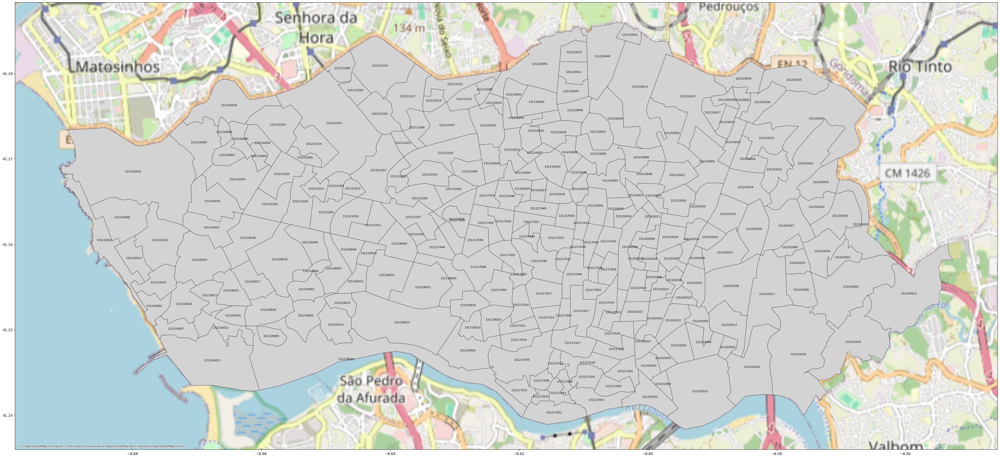

In [23]:
# plot a map of the sections with a label at the center for each sector
sections['centroid'] = sections.centroid
ax = sections.plot(color='lightgray', figsize=(50,50), markersize=4.0, edgecolor='black', linewidth=0.5)
for i, row in sections.iterrows():
    ax.text(row.centroid.x, row.centroid.y, row.id, fontsize=8, ha='center', va='center')
cx.add_basemap(ax, crs=sections.crs) 

#### Mapa de origem e destino das viagens de educação (top 3 para cada origem)

same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same
same


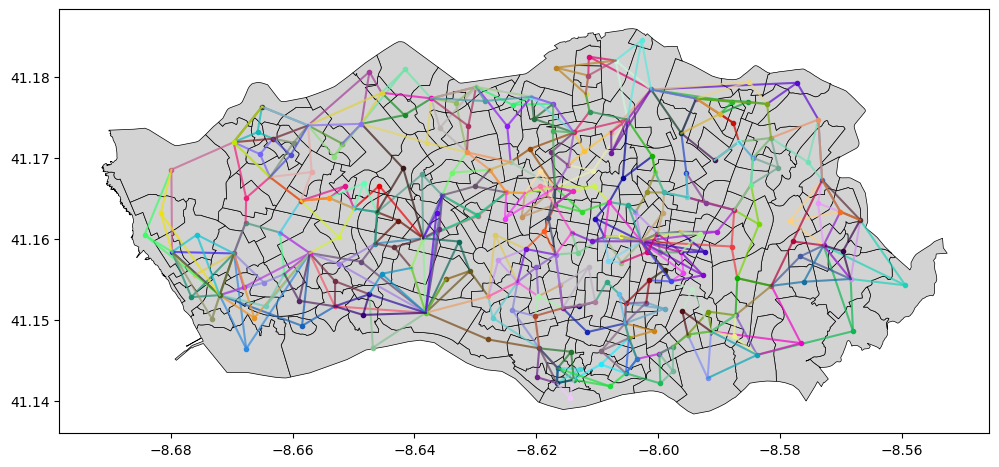

In [162]:
# plot the origin destination map using the younger education trips
fig, ax = plt.subplots(figsize=(12, 12))
young_education_probs = education_trips['young_education']

# Plot the origin sections
sections.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Plot the top 3 destinations for each origin
for origin_id, top_destinations in enumerate(np.argsort(young_education_probs, axis=1)[:, -3:]):
    section_id = sections['id'].values[origin_id]
    origin_coords = sections.loc[sections['id'] == section_id, 'centroid'].values[0]
    color = np.random.rand(3,)
    # plot a dot at the origin
    ax.plot(origin_coords.x, origin_coords.y, 'o', color=color, markersize=3)
    for dest_id in top_destinations:
        dest_section_id = sections['id'].values[dest_id]
        # if dest_section_id == section_id:
        #     print('same')
        dest_coords = sections.loc[sections['id'] == dest_section_id, 'centroid'].values[0]
        ax.plot([origin_coords.x, dest_coords.x], [origin_coords.y, dest_coords.y], color=color, alpha=0.7)
        
plt.show()

Isto é útil? O início da ideia talves. Misturamos alguns critérios com pesos diferentes para ter uma única métrica de "atratividade" de uma secção para outra. 
Tipo população jovens * atratividade escolar * 4 (muitas viagens) + jovens+adultos * atratividade entretenimento * 1.2 (menos viagens) + ...
E no fim podemos usar as probabilidades obtidas para simular viagens entre secções.

# Simulation?

In [32]:
# load top_10_destinations_by_origin3.json
top_10_destinations_by_origin = pd.read_json("top_10_destinations_by_origin3.json")
top_10_destinations_by_origin

,section_id,origin_x,origin_y,dest_x,dest_y,trip_flow
0,131202012,-8.596079,41.151091,-8.596478,41.160841,266366.572412
1,131202012,-8.596079,41.151091,-8.594431,41.153770,267382.759015
2,131202012,-8.596079,41.151091,-8.601977,41.152111,271351.992276
3,131202012,-8.596079,41.151091,-8.592208,41.164416,283488.091926
4,131202012,-8.596079,41.151091,-8.591355,41.148548,290676.694427
...,...,...,...,...,...,...
2425,131217050,-8.612577,41.163333,-8.610539,41.166475,499831.824775
2426,131217050,-8.612577,41.163333,-8.608062,41.164525,526948.437529
2427,131217050,-8.612577,41.163333,-8.608830,41.160221,559407.568909
2428,131217050,-8.612577,41.163333,-8.614205,41.160749,678748.324338


In [33]:
# keep only the top 5 rows per section_id by distance from origin_x, origin_y to dest_x, dest_y
# first add a column with the distance
# pos1 = osmium.geom.Coordinates(pos1[0], pos1[1])
# pos2 = osmium.geom.Coordinates(pos2[0], pos2[1])
top_10_destinations_by_origin['distance'] = top_10_destinations_by_origin.apply(lambda x: haversine_distance(
    osmium.geom.Coordinates(x.origin_y, x.origin_x), osmium.geom.Coordinates(x.dest_y, x.dest_x)), axis=1)

In [34]:
# for each section id keep only the 5 biggest distances
top_5_destinations_by_distance = top_10_destinations_by_origin.groupby('section_id').apply(lambda x: x.nlargest(5, 'distance')).reset_index(drop=True)

C:\Users\jcarv\AppData\Local\Temp\ipykernel_2968\389077631.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5_destinations_by_distance = top_10_destinations_by_origin.groupby('section_id').apply(lambda x: x.nlargest(5, 'distance')).reset_index(drop=True)


In [35]:
top_5_destinations_by_distance

,section_id,origin_x,origin_y,dest_x,dest_y,trip_flow,distance
0,131202001,-8.599665,41.142127,-8.592208,41.164416,145484.705380,2587.895014
1,131202001,-8.599665,41.142127,-8.591788,41.150994,149180.372125,1310.945434
2,131202001,-8.599665,41.142127,-8.591355,41.148548,135393.522710,1163.240714
3,131202001,-8.599665,41.142127,-8.598977,41.151338,173181.755315,1015.903576
4,131202001,-8.599665,41.142127,-8.591907,41.142782,147778.604954,865.853488
...,...,...,...,...,...,...,...
1210,131218025,-8.646812,41.146557,-8.661329,41.155639,294922.509080,1898.473981
1211,131218025,-8.646812,41.146557,-8.643304,41.158930,286574.521514,1415.429131
1212,131218025,-8.646812,41.146557,-8.640489,41.156398,282649.617538,1290.622326
1213,131218025,-8.646812,41.146557,-8.648725,41.157155,311486.233409,1184.654619


In [36]:
summed_trip_flows = top_5_destinations_by_distance.groupby('section_id')['trip_flow'].sum()

In [37]:
# add a column with the normalized (0 to 1) trip_flow per section
top_5_destinations_by_distance['trip_flow_n'] = top_5_destinations_by_distance.apply(lambda x: x.trip_flow / summed_trip_flows[x.section_id], axis=1)

In [38]:
# simulate trips
# for each section, simulate trips to the top 5 destinations
# the number of trips is proportional to the trip_flow
for i, row in top_5_destinations_by_distance.iterrows():
    # if i > 125:
    #     break
    # trip_flow is currently unbounded
    section_id = str(int(row.section_id))
    section_population = sections.loc[sections['id'] == section_id, 'N_INDIVIDUOS'].values[0]
    section_trip_freq = int(section_population / 20)
    
    trips = np.random.choice([0, 1], size=section_trip_freq, p=[1-row.trip_flow_n, row.trip_flow_n])
    top_5_destinations_by_distance.at[i, 'trips'] = trips.sum()
    

In [39]:
top_5_destinations_by_distance

,section_id,origin_x,origin_y,dest_x,dest_y,trip_flow,distance,trip_flow_n,trips
0,131202001,-8.599665,41.142127,-8.592208,41.164416,145484.705380,2587.895014,0.193716,8.0
1,131202001,-8.599665,41.142127,-8.591788,41.150994,149180.372125,1310.945434,0.198637,5.0
2,131202001,-8.599665,41.142127,-8.591355,41.148548,135393.522710,1163.240714,0.180280,4.0
3,131202001,-8.599665,41.142127,-8.598977,41.151338,173181.755315,1015.903576,0.230596,8.0
4,131202001,-8.599665,41.142127,-8.591907,41.142782,147778.604954,865.853488,0.196771,7.0
...,...,...,...,...,...,...,...,...,...
1210,131218025,-8.646812,41.146557,-8.661329,41.155639,294922.509080,1898.473981,0.200219,7.0
1211,131218025,-8.646812,41.146557,-8.643304,41.158930,286574.521514,1415.429131,0.194552,4.0
1212,131218025,-8.646812,41.146557,-8.640489,41.156398,282649.617538,1290.622326,0.191887,9.0
1213,131218025,-8.646812,41.146557,-8.648725,41.157155,311486.233409,1184.654619,0.211464,10.0


In [40]:
#tore as json
top_5_destinations_by_distance.to_json("top_5_destinations_by_distance.json", indent=2, orient="records")

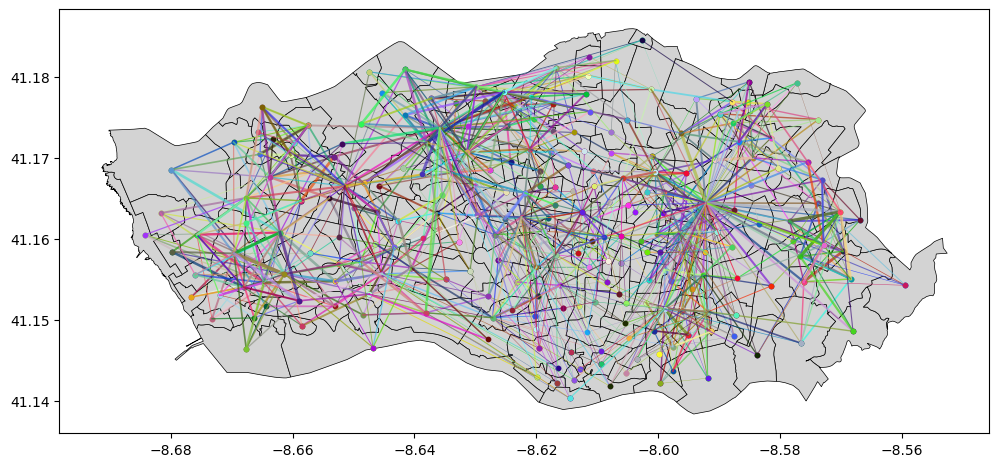

In [36]:
# plot the trips
fig, ax = plt.subplots(figsize=(12, 12))
sections.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

for i, row in top_5_destinations_by_distance.iterrows():
    section_id = str(int(row.section_id))
    origin_coords = sections.loc[sections['id'] == section_id, 'centroid'].values[0]
    color = np.random.rand(3,)
    ax.plot(origin_coords.x, origin_coords.y, 'o', color=color, markersize=3)
    dest_coords = osmium.geom.Coordinates(row.dest_y, row.dest_x)
    ax.plot([origin_coords.x, dest_coords.y], [origin_coords.y, dest_coords.x], color=color, alpha=0.7, linewidth=row.trips/10)

---

---
---
# N

In [ ]:
# paths between sections
# distances between sections
# time between sections
# number of trips between sections
# number of inhabitants per section



In [18]:
# get average trip distance and time to every other section

# floyd warshall algorithm
pred, dist = nx.floyd_warshall_predecessor_and_distance(G, weight='length')
# pred2, dist2 = nx.floyd_warshall_predecessor_and_distance(G2, weight='length')


In [75]:
pred

{'1ADA1': {'CI31': '1ADA1',
  '1R9A1': '1ADA1',
  'ADA2': '1ADA1',
  'ADA3': '1ADA1',
  'ADA4': '1ADA1',
  'CI32': '1ADA1',
  '5776': '1ADA1',
  'CSP1': 'ADA3',
  'CSP2': 'CSP1',
  'AVTE1': 'CAM1',
  'AVTE2': 'CAM1',
  'BRRG1': 'CAM3',
  'CAM1': 'CI32',
  'ISEP2': 'AVTE1',
  'TLHR2': 'CAM1',
  'TLHR3': 'CAM1',
  'CAM3': 'TLHR3',
  'CPL': 'CSP1',
  'CPL2': 'CSP1',
  'VFM2': 'CSP1',
  'VFM3': 'CSP1',
  'VFM6': 'VFM7',
  '5775': 'CPL2',
  'VFM7': 'CSP2',
  'ISEP1': 'ISEP2',
  'ISEP3': 'ISEP2',
  '5772': 'ISEP2',
  'DSS': 'ISEP3',
  'ISEP4': 'ISEP3',
  'ESS1': 'ISEP4',
  'AML1': 'AML2',
  'AML2': 'TLHO1',
  'AML3': 'TLHO2',
  'AML4': 'TLHO1',
  'AZ': 'BLG1',
  'BRRG2': 'BRRG1',
  'IB2': 'ST1',
  'IB3': 'ST1',
  'ST1': 'ST2',
  'ST2': 'AML2',
  'ST3': 'ST2',
  'ST4': 'ST2',
  'TLHO1': 'AML2',
  'TLHO2': 'TLHO1',
  'TLHR1': 'TLHR2',
  'BLG1': 'TLHR3',
  'BLG2': 'TLHR3',
  '1AL2': 'TRD3',
  '1AL6': 'TRD1',
  '1SBNT': 'AL2',
  'AAL1': 'TRD6',
  'AAL2': 'TRD3',
  'AAL4': 'TRD3',
  'AAL5': '1AL7

In [19]:
nearest_nodes = {} # relative to sections
for section in sections['id']:
    section_centroid = sections.loc[sections['id'] == section, 'centroid']
    nearest_nodes[section] = ox.distance.nearest_nodes(G, X=section_centroid.x.values[0], Y=section_centroid.y.values[0])
    # average_distances[section] = np.mean([dist[nearest_nodes[section]][nearest_nodes[other]] for other in sections['id']])


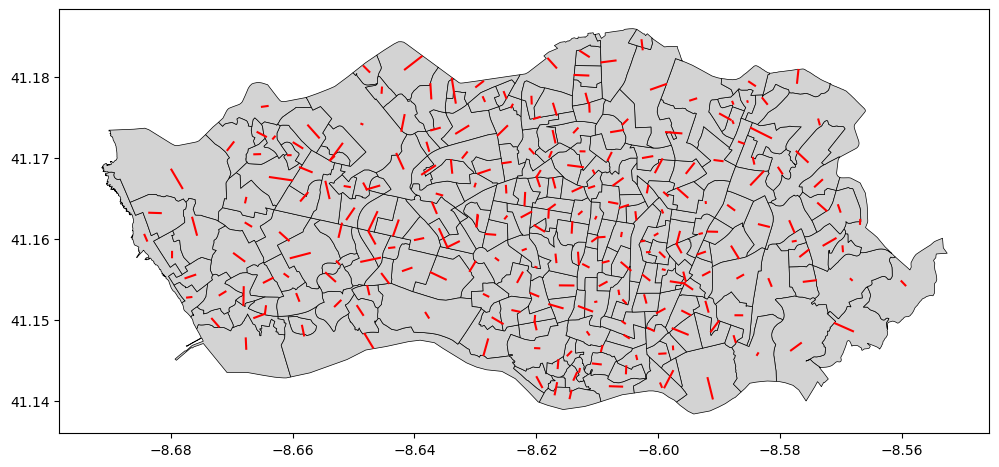

In [29]:
# plot the sections and the nearest nodes, a line between them
fig, ax = plt.subplots(figsize=(12, 12))
sections.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

for section in sections['id']:
    section_centroid = sections.loc[sections['id'] == section, 'centroid']
    nearest_node = nearest_nodes[section]
    nearest_coords = G.nodes[nearest_node]['x'], G.nodes[nearest_node]['y']
    ax.plot([section_centroid.x.values[0], nearest_coords[0]], [section_centroid.y.values[0], nearest_coords[1]], color='red')

In [20]:
# get the average distance to all sectors from each sector
straight_average_distances = {}
# osmium.geom.Coordinates(x.origin_y, x.origin_x), osmium.geom.Coordinates(x.dest_y, x.dest_x))
for section in sections['id']:
    section_centroid = sections.loc[sections['id'] == section, 'centroid']
    straight_average_distances[section] = np.mean([haversine_distance(osmium.geom.Coordinates(section_centroid.y.values[0], section_centroid.x.values[0]), osmium.geom.Coordinates(G.nodes[nearest_nodes[section]]['y'], G.nodes[nearest_nodes[section]]['x'])) for section in sections['id']])
    

In [73]:
straight_average_distances

{'131217050': 2909.0918542317695,
 '131217049': 2895.4308288191687,
 '131203025': 6068.512212550595,
 '131203017': 4659.667710121978,
 '131217028': 2934.604170929316,
 '131210028': 4453.13818939918,
 '131202023': 4346.121891243092,
 '131216025': 5647.2412802575445,
 '131216019': 5323.6843946808485,
 '131218017': 5122.624081625425,
 '131211014': 3651.668529321745,
 '131211019': 4252.513398903738,
 '131216023': 5951.323367551178,
 '131210049': 3130.451778625852,
 '131217042': 2965.042512353994,
 '131202018': 3299.5166883835127,
 '131202019': 3462.564086027364,
 '131210015': 3240.2712633993683,
 '131210012': 4097.787610802857,
 '131210037': 3761.4571187300703,
 '131210040': 3823.7964701489186,
 '131202024': 3732.898481324944,
 '131217031': 3432.027079836408,
 '131217009': 3673.1915137281685,
 '131202016': 3547.513078707226,
 '131203027': 4285.896488266294,
 '131217002': 3090.9124445161724,
 '131211008': 3498.2280841608235,
 '131217044': 2891.5554464696397,
 '131217021': 2886.9584142539375

In [21]:
# compute the average distances using G
average_distances = {}
average_times = {}

# first get a matrix of the distances and paths between the nearest nodes
nearest_node_distances = np.zeros((len(sections), len(sections)))
nearest_node_paths = {}

for i, section1 in enumerate(sections['id']):
    for j, section2 in enumerate(sections['id']):
        # print(nearest_nodes[section1], nearest_nodes[section2])
        nearest_node_distances[i, j] = dist[nearest_nodes[section1]][nearest_nodes[section2]]
        nearest_node_paths[(section1, section2)] = nx.reconstruct_path(nearest_nodes[section1], nearest_nodes[section2], pred)
        

In [22]:
# get the average distance and time between each section and all the others
for section1 in sections['id']:
    # row mean
    average_distances[section1] = np.mean(nearest_node_distances[sections['id'] == section1])
    average_times[section1] = np.mean([nearest_node_distances[i, j] / 5000 for i, j in np.ndindex(nearest_node_distances.shape)])

In [ ]:
# plot heatmap of average distances
sections['average_distance'] = sections['id'].map(average_distances)

In [ ]:
# plot
ax = sections.plot("average_distance", cmap="Reds", figsize=(12,12), legend=True, markersize=3.5)

In [25]:
# get the difference between the average distance and the straight average distance and plot
sections['straight_average_distance'] = sections['id'].map(straight_average_distances)

sections['distance_diff'] = sections['average_distance'] - sections['straight_average_distance']

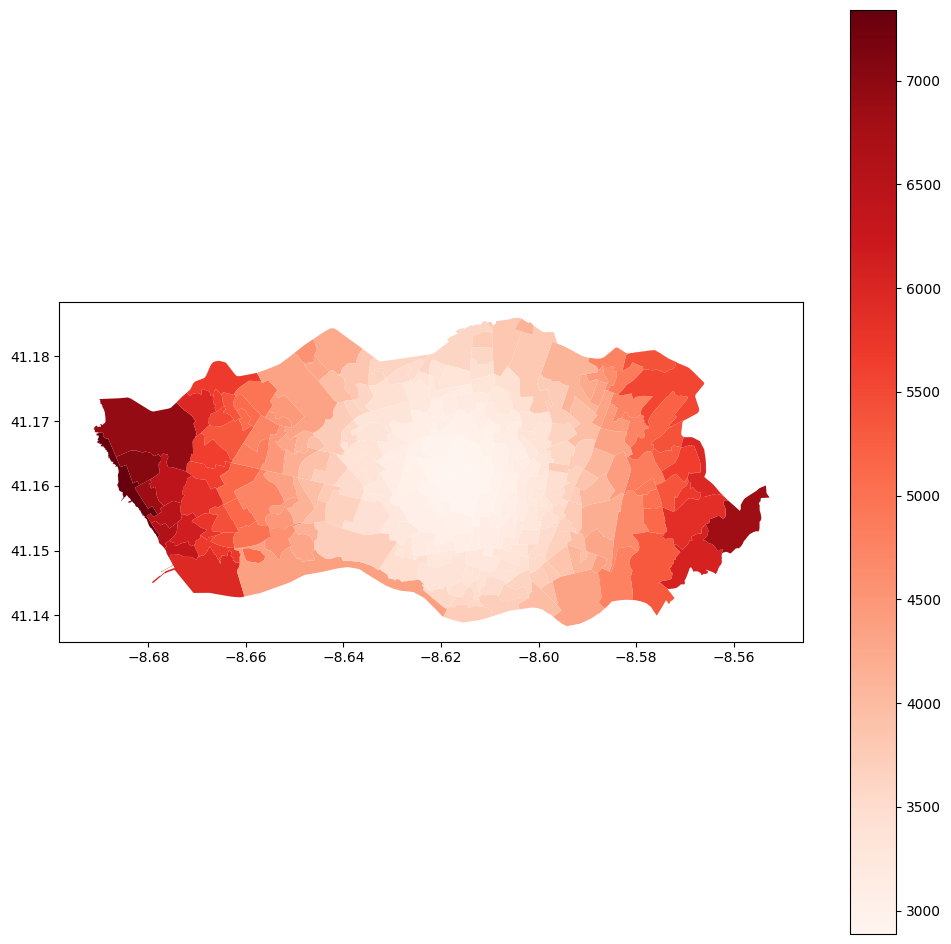

In [26]:
ax = sections.plot("straight_average_distance", cmap="Reds", figsize=(12,12), legend=True, markersize=3.5)


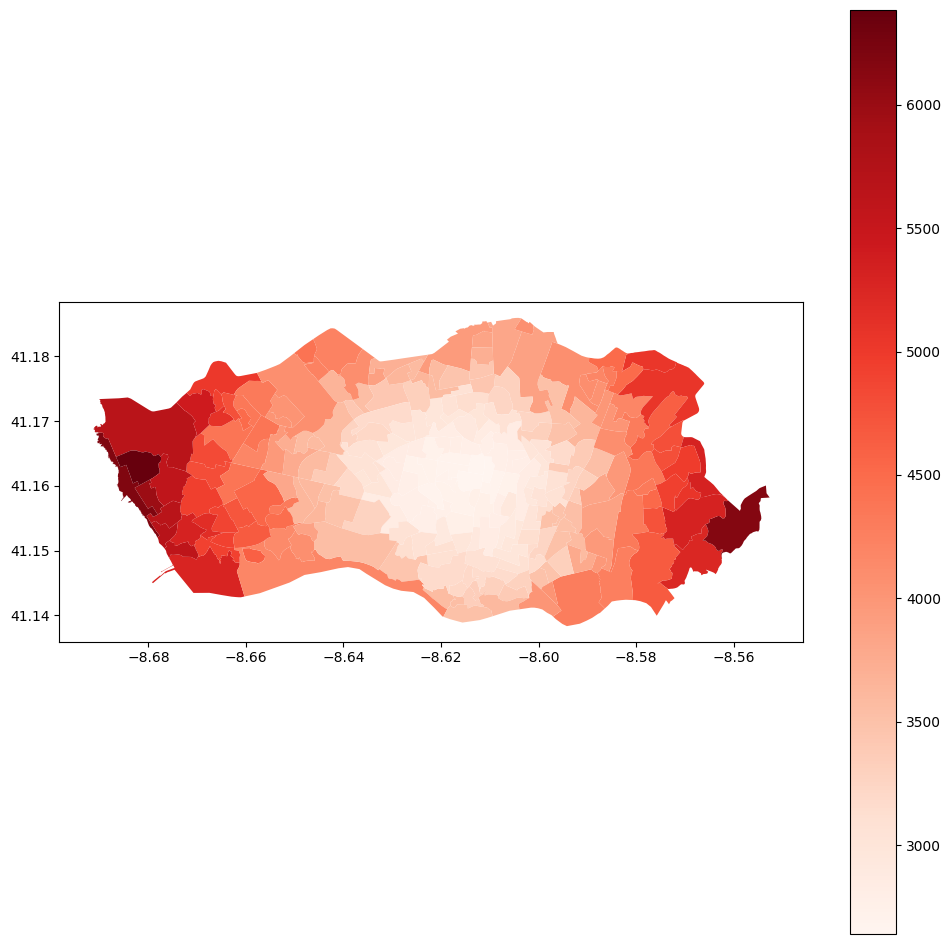

In [38]:
ax = sections.plot("average_distance", cmap="Reds", figsize=(12,12), legend=True, markersize=3.5)


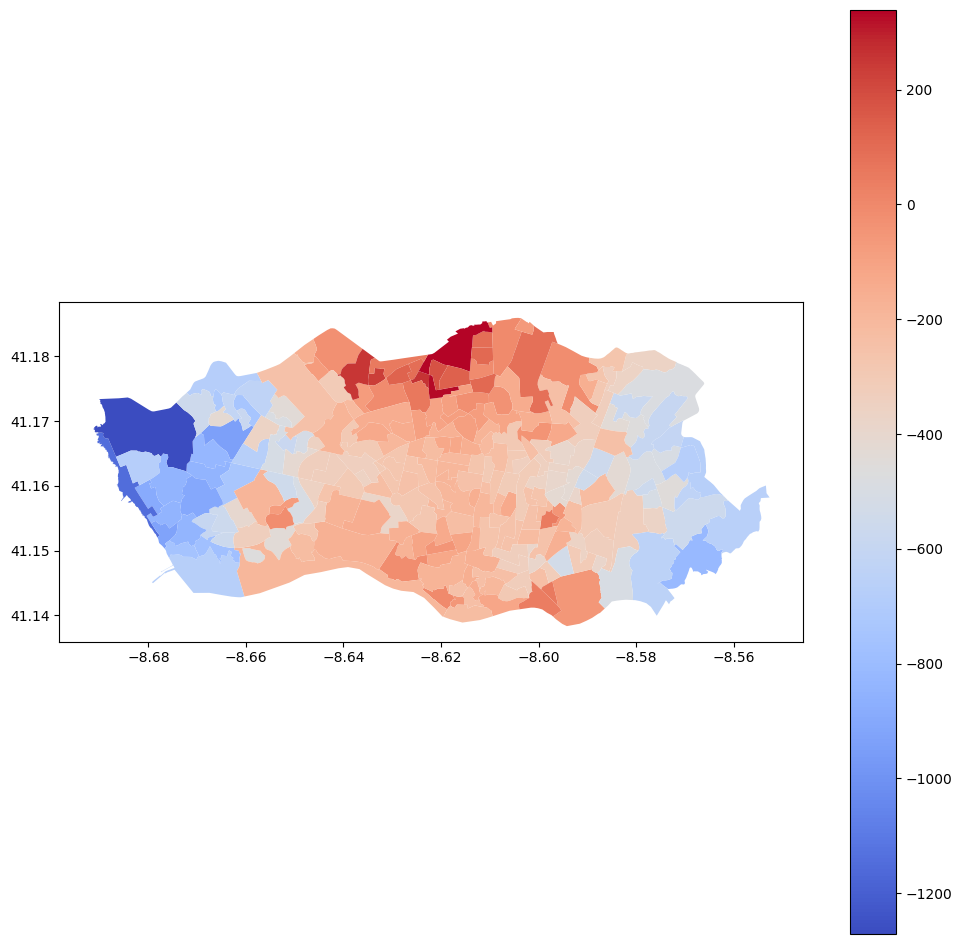

In [128]:
ax = sections.plot("distance_diff", cmap="coolwarm", figsize=(12,12), legend=True, markersize=3.5)

In [27]:
nearest_node_distances

array([[   0.        ,  418.23499608, 4781.7228572 , ..., 3564.53229577,
        1506.57255074, 2727.67029398],
       [ 418.23499608,    0.        , 5199.95785328, ..., 3146.29729969,
        1917.90435162, 3078.0515919 ],
       [4781.7228572 , 5199.95785328,    0.        , ..., 7998.00316948,
        3718.19161866, 2510.34291653],
       ...,
       [3564.53229577, 3146.29729969, 7998.00316948, ...,    0.        ,
        4951.60909169, 5683.21675115],
       [1506.57255074, 1917.90435162, 3718.19161866, ..., 4951.60909169,
           0.        , 1376.18286096],
       [2727.67029398, 3078.0515919 , 2510.34291653, ..., 5683.21675115,
        1376.18286096,    0.        ]])

In [31]:
max_distance = 750
# starting from each sector, find the sectors that are within max_distance
# and count how many there are

In [32]:
sectors_within_distance = {}
for section in sections['id']:
    sectors_within_distance[section] = len([other for other in sections['id'] if nearest_node_distances[sections['id'] == section, sections['id'] == other] < max_distance])
    

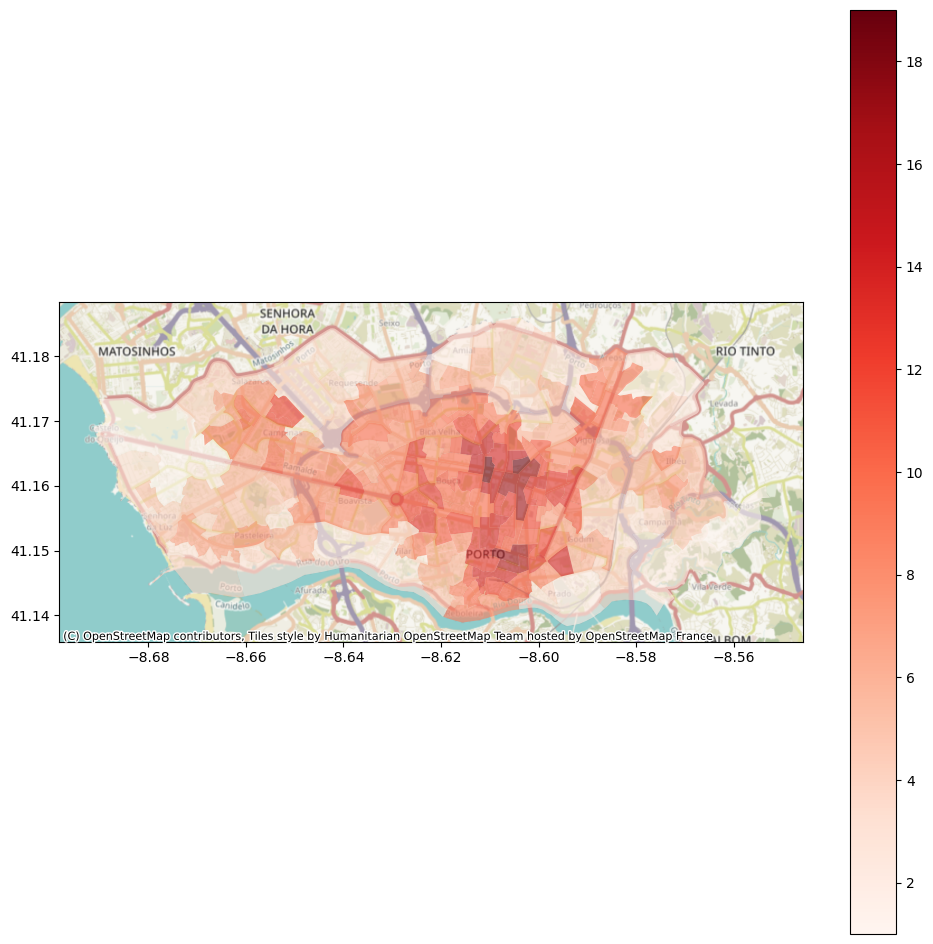

In [40]:
# plot
sections['sectors_within_distance'] = sections['id'].map(sectors_within_distance)
ax = sections.plot("sectors_within_distance", cmap="Reds", figsize=(12,12), alpha=0.6, legend=True, markersize=3.5)
# basemap
cx.add_basemap(ax, crs=sections.crs)

